# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [12]:
import os
#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

In [13]:
from utils import get_dataset

In [14]:
import matplotlib.pyplot as plt
%matplotlib inline

In [15]:
import numpy as np

In [16]:
import tensorflow.compat.v1 as tf

In [17]:
from matplotlib.patches import Rectangle

In [18]:
#Read both train and validation data
dataset = get_dataset("../data/*/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['../data/*/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['../data/*/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 96


In [ ]:
ds2 = dataset.unbatch()
#list(ds2.as_numpy_iterator())


In [ ]:
ds4 = dataset.take(count=-1)
i = 0
for element in ds4.as_numpy_iterator():
    print(element['filename'])
    i += 1
    if i > 10:
        break

print(i)

In [ ]:
for i in iter(dataset):
    print(i)

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices([1, 2, 3])

In [ ]:
list(dataset.as_numpy_iterator())

In [ ]:
dataset = dataset.repeat(3)
list(dataset.as_numpy_iterator())

In [ ]:
type(dataset)

In [ ]:
dir(dataset)

In [18]:
ds1 = dataset.enumerate()
i = 0
for element in ds1.as_numpy_iterator():
    print(element)
    i += 1
    if i > 40:
        break

(0, {'image': array([[[176, 204, 251],
        [178, 207, 251],
        [185, 212, 255],
        ...,
        [ 62,  75,  81],
        [ 63,  77,  90],
        [ 70,  83,  99]],

       [[176, 204, 251],
        [180, 208, 255],
        [179, 206, 251],
        ...,
        [ 63,  76,  82],
        [ 71,  85,  96],
        [ 64,  77,  93]],

       [[175, 203, 250],
        [177, 205, 252],
        [176, 205, 249],
        ...,
        [ 70,  83,  89],
        [ 79,  93, 104],
        [ 72,  86,  99]],

       ...,

       [[ 69,  72,  79],
        [ 70,  73,  80],
        [ 71,  74,  81],
        ...,
        [ 71,  66,  70],
        [ 70,  68,  71],
        [ 68,  66,  69]],

       [[ 69,  72,  77],
        [ 69,  72,  77],
        [ 69,  72,  79],
        ...,
        [ 66,  61,  65],
        [ 70,  66,  67],
        [ 72,  68,  69]],

       [[ 69,  72,  77],
        [ 69,  72,  77],
        [ 69,  72,  79],
        ...,
        [ 68,  63,  67],
        [ 70,  66,  67],
        [ 

In [ ]:
dataset._flat_shapes

In [ ]:
ds_size = sum(1 for _ in dataset)
ds_size

In [ ]:
for elem in dataset:
    print('#')

In [ ]:
dataset.cardinality()

In [ ]:
for elem in ds1:
    #print(elem.keys())
    #print(elem['original_image_spatial_shape'].numpy())
    img = elem['image']
    img = tf.cast(img, tf.float32)
    boxes = elem['groundtruth_boxes']
    #print(img.shape)
    #print(tf.reshape(img, [ 1, -1]))
    
    img = img / 255.
    img = tf.expand_dims(img, axis=0)
    boxes = tf.expand_dims(boxes, axis=0)
    colors = np.array([[1.0, 0.0, 0.0], [0.0, 0.0, 1.0]])
    img = tf.image.draw_bounding_boxes(img, boxes, colors)

    img = tf.squeeze(img, axis=0)
    plt.imshow(img.numpy())
    plt.axis("off")
    break


#https://www.tensorflow.org/api_docs/python/tf/compat/v1/image/draw_bounding_boxes

In [ ]:
object_classes = {1:'vehicle', 2:'pedestrian', 4:'cyclist'}
object_color_map = {1:'r', 2:'b', 4:'g'}
object_color_map = {1:[1., 0., 0.], 2:[0., 1., 0.], 4:[0., 0., 1.]}

In [ ]:
def display_image(img, bboxes, classes):
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    ax = plt.gca()

    #get width and height of image
    width  = img.shape[0]
    height = img.shape[1]

    #scale factor for scaling relative bounding box coordinates to absolute image coordinates
    box_scale_fac = [height-1, width-1, height-1, width-1]

    for (bb, class_id) in zip(bboxes, classes):
        y1, x1, y2, x2 = bb * box_scale_fac
        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor=object_color_map[class_id])
        ax.add_patch(rec)
#    
#    ax[1].imshow(aug_img)
#    for bb in aug_bboxes:
#        y1, x1, y2, x2 = bb
#        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor='r')
#        ax[1].add_patch(rec)
#    plt.show()

In [ ]:
for elem in ds1:
    #print(elem.keys())
    #print(elem['original_image_spatial_shape'].numpy())
    img = elem['image'].numpy()
    bboxes = elem['groundtruth_boxes'].numpy()
    classes = elem['groundtruth_classes'].numpy()
    #display_image(img, bboxes, classes)

    #print(elem['groundtruth_classes'])
    #print(elem['groundtruth_image_classes'])
    #print(elem['groundtruth_not_exhaustive_classes'])
    #print(elem['groundtruth_weights'])
    #print(elem['source_id'])
    
    classes = elem['groundtruth_classes'].numpy()
    boxes = elem['groundtruth_boxes']
    img = elem['image']
    img = tf.cast(img, tf.float32)
    print(img.shape)
    #print(tf.reshape(img, [ 1, -1]))
    
    img = img / 255.
    img = tf.expand_dims(img, axis=0)
    boxes = tf.expand_dims(boxes, axis=0)
    colors = np.array( [object_color_map[class_id] for class_id in classes] )
    #colors = tf.convert_to_tensor(colors, dtype=tf.float32)
    print(colors)
    img = tf.image.draw_bounding_boxes(img, boxes, colors=colors)

    img = tf.squeeze(img, axis=0)
    plt.figure(figsize=(12, 12))
    plt.imshow(img.numpy())
    #plt.axis("off")
    break


#https://www.tensorflow.org/api_docs/python/tf/compat/v1/image/draw_bounding_boxes

In [ ]:
for batch in dataset.take(1):
    print(batch['image'])

In [ ]:
#Show images
#Source: https://www.tensorflow.org/tutorials/load_data/images
#plt.figure(figsize=(10, 10))
#for images, labels in dataset.take(1):
#  for i in range(9):
#    ax = plt.subplot(3, 3, i + 1)
#    plt.imshow(images[i].numpy().astype("uint8"))
#    plt.title(class_names[labels[i]])
#    plt.axis("off")
plt.figure(figsize=(10, 10))
for batch in dataset.take(1):
    i = 0
    for image in batch['image']:
        print(image.numpy().shape)
        #ax = plt.subplot(1, 10, i + 1)
        plt.imshow(image.numpy().astype("uint8"))
        break
    break

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [44]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    Args:
        batch: Dictionary holding one element from a tensorflow dataset.
    
    Returns:
        No returns
    
    Raises:
        No exceptions raised
    """

    #Mapping of object classes to class id retrieved from file "label_map.pbtxt"
    #Could not find this information in the dataset
    #1:'vehicle' -> red
    #2:'pedestrian' -> green
    #4:'cyclist' -> blue
    object_color_map = {1:'red', 2:'green', 4:'blue'}
    
    #Get image data
    img = elem['image'].numpy()

    #Get bounding boxes
    boxes = elem['groundtruth_boxes'].numpy()

    #Get groundtruth classes
    classes = elem['groundtruth_classes'].numpy()

    #Create new figure and plot image
    _, ax = plt.subplots(figsize=(10,10))
    ax.imshow(img)
    plt.axis("off")
    plt.title(elem['filename'].numpy().decode())


    #get width and height of image
    (width, height, _) = img.shape

    #scale factor for scaling relative bounding box coordinates to absolute image coordinates
    box_scale_fac = [height, width, height, width]

    #Draw bounding boxes
    for (bb, class_id) in zip(boxes, classes):
        #Scale bounding box coordinates to absolute image coordinates
        y1, x1, y2, x2 = bb * box_scale_fac
        #Create and draw bounding box
        rec = Rectangle((x1, y1), x2-x1, y2-y1, facecolor='none', edgecolor=object_color_map[class_id])
        ax.add_patch(rec)



## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

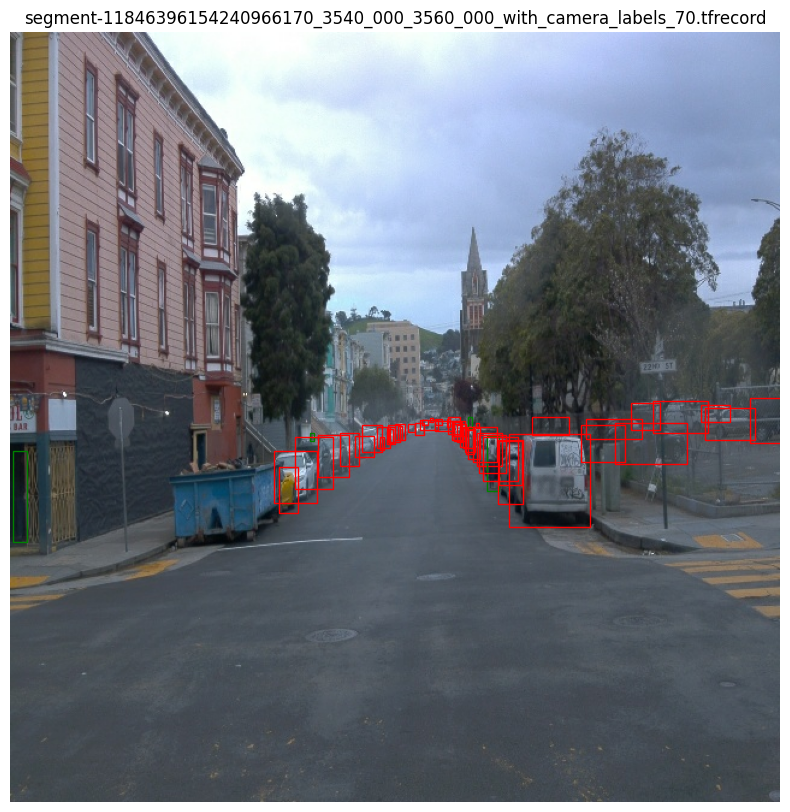

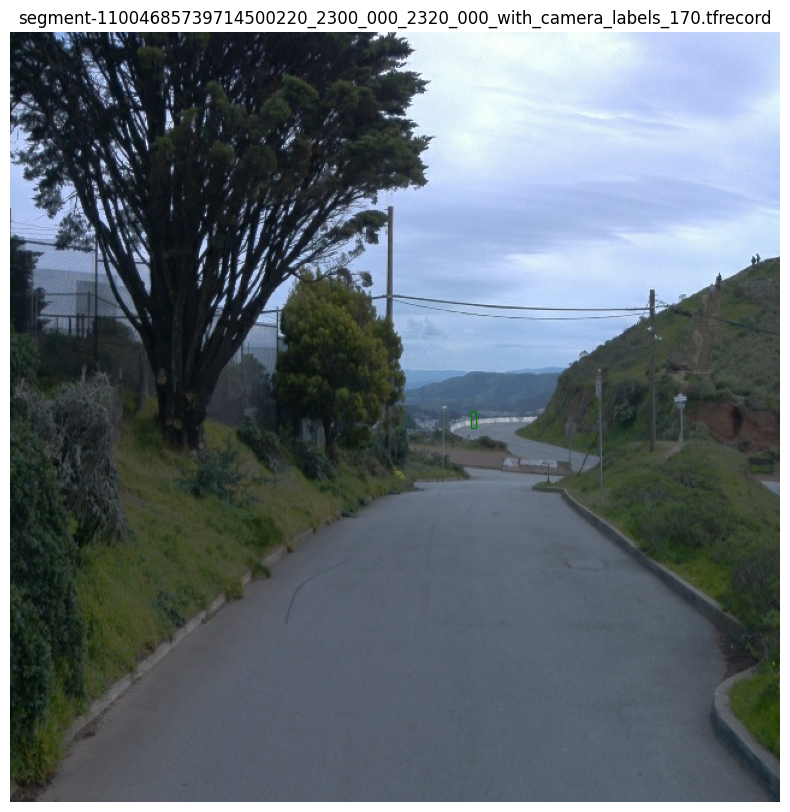

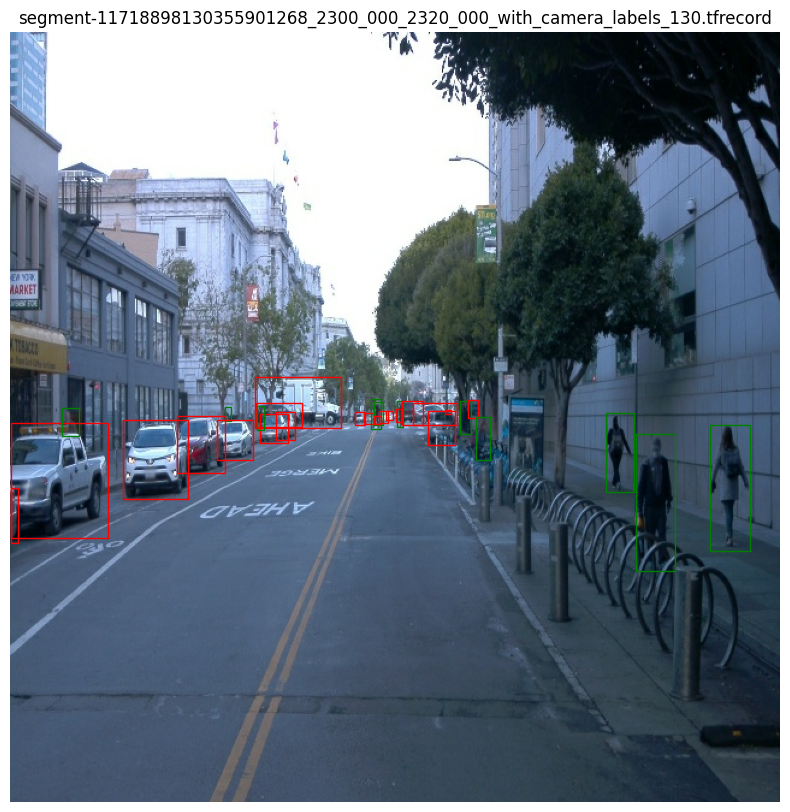

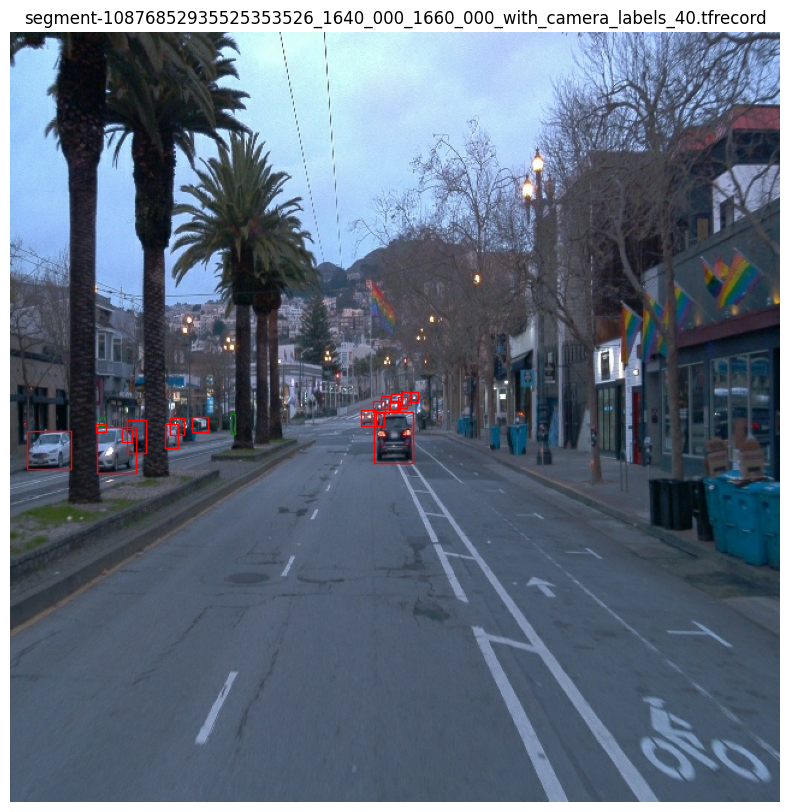

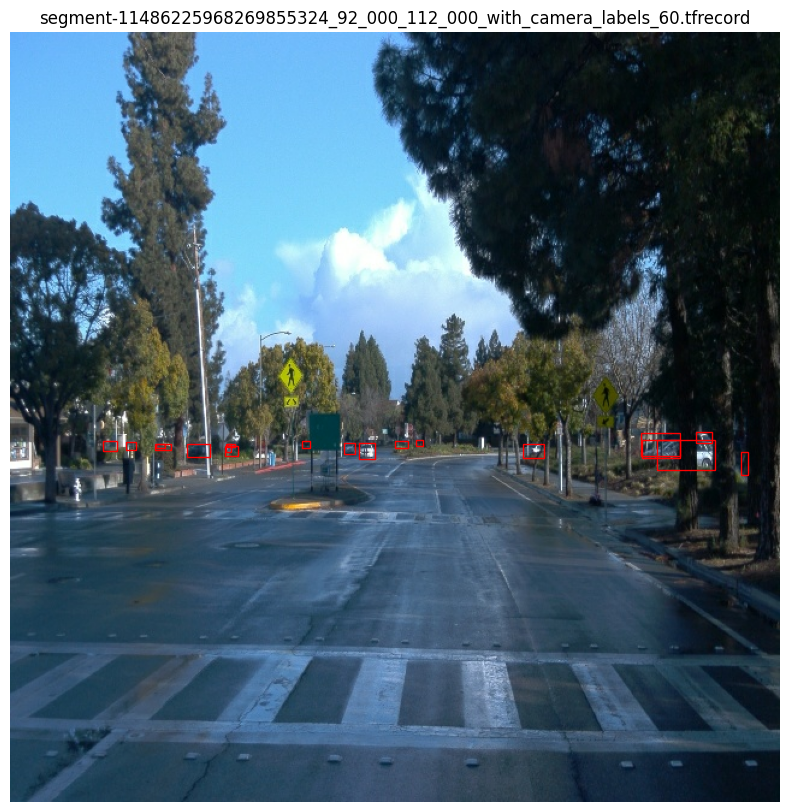

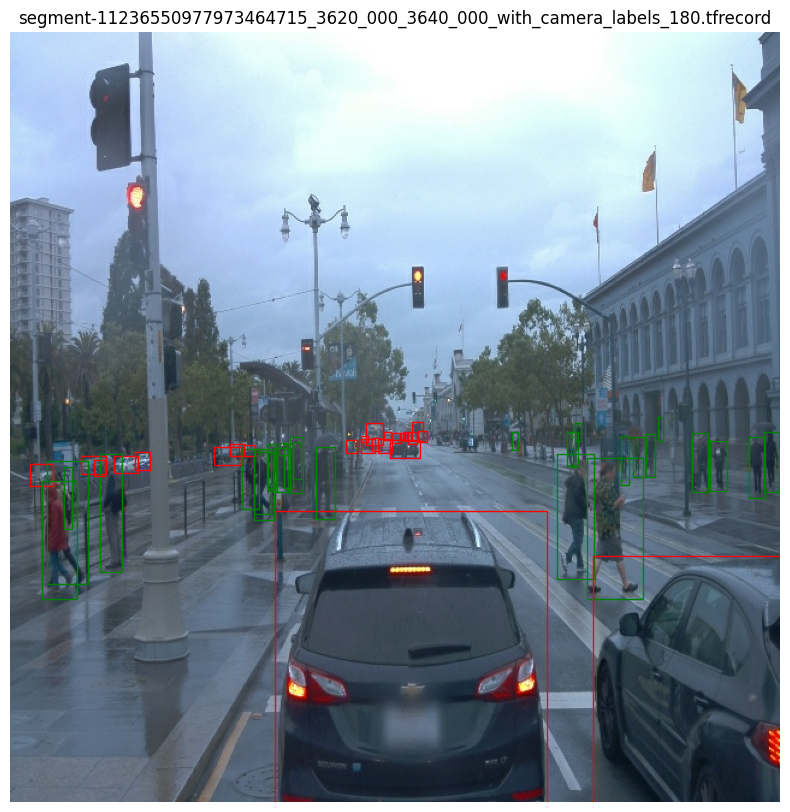

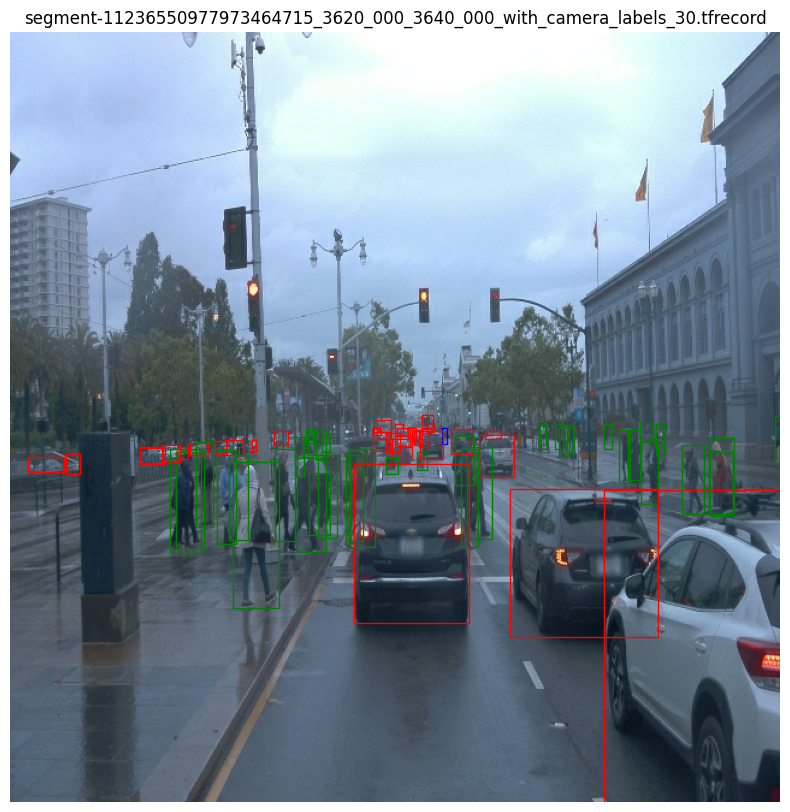

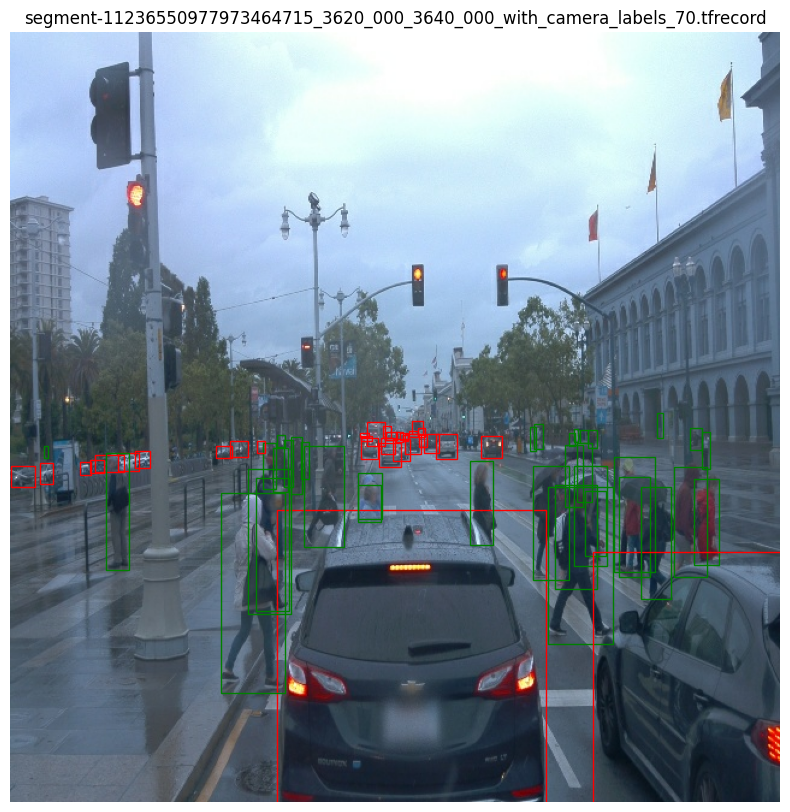

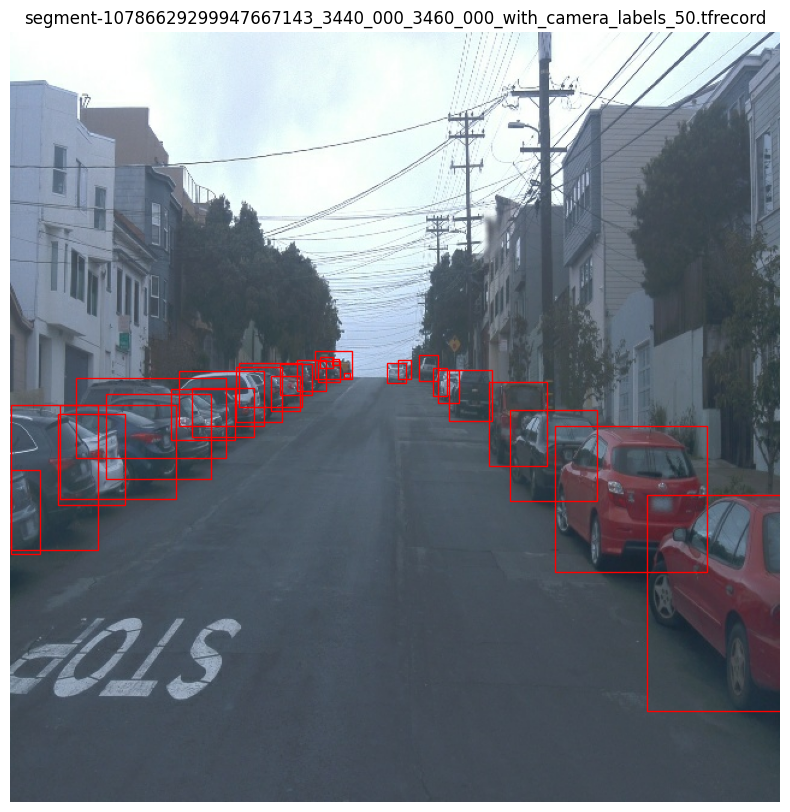

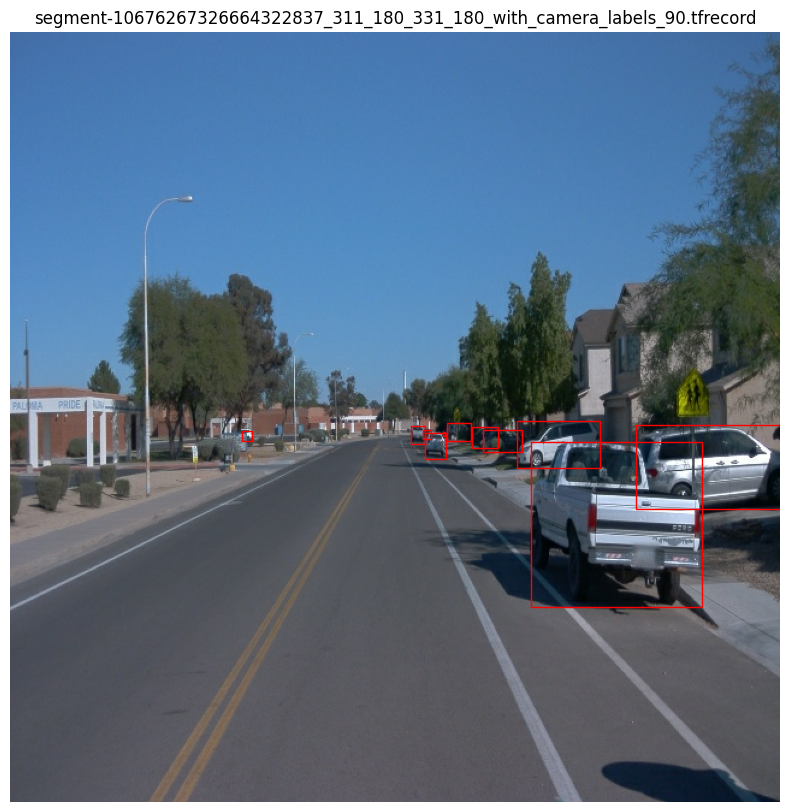

In [46]:
#Get 10 elements from the dataset and display the images with the respective bounding boxes
for elem in dataset.take(10):
    display_instances(elem)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...